solver: <class 'src.solver.loader_txt.LoaderTxt'>


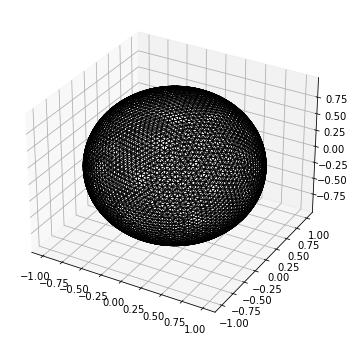

In [110]:
from src.solver.loader_txt import LoaderTxt

solver = LoaderTxt(
  n = 4096,
  # load_base_path="out/v1.0.0/min_potential/txt_dump",
  load_base_path="out/manual/min_potential/txt_dump",
  is_to_print_final=True,
)

solver.solve()

In [111]:
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
import numpy as np
import mpl_toolkits.mplot3d as mp3d

c_points = solver.c_points
hull = ConvexHull(c_points)

plt.figure(
  figsize=(10,10),
  dpi=1200
)
ax = plt.axes(projection='3d')

# for simplex in hull.simplices:
#   simplex = np.append(simplex, simplex[0])
#   ax.plot(c_points[simplex, 0], c_points[simplex, 1], c_points[simplex, 2], 'k-', linewidth=0.5);
# write_to_txt(c_pointoints)

black_lines = []
grey_lines = []

def add_line(a, b):
  # if a[0]>-0.18 and b[0]>-0.18: ## for minpotential n=64
  if a[0]>0 or b[0]>0:
    black_lines.append([[a[0], b[0]], [a[1], b[1]], [a[2], b[2]]])
  else:
    grey_lines.append([[a[0], b[0]], [a[1], b[1]], [a[2], b[2]]])

for simplex in hull.simplices:
  a, b, c = simplex
  add_line(c_points[a], c_points[b])
  add_line(c_points[b], c_points[c])
  add_line(c_points[c], c_points[a])

for l in grey_lines:
  ax.plot(*l, '0.8', linewidth=0.5)
for l in black_lines:
  ax.plot(*l, 'k-', linewidth=0.5)

ax.axis('equal')
ax.axis('off')

ax.view_init(elev=0, azim=0)

plt.show()